<a href="https://colab.research.google.com/github/MortezaZS/INSE6220Project/blob/main/Morteza_Zangeneh_Soroush_40205549_INSE6220_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()
     

'2.3.6'

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:

print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)
     

Pandas version:  1.3.5
Seaborn version:  0.11.2


In [ ]:

#read cvs file into dataframe
df = pd.read_csv('/content/Raisin_Dataset.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())
     

Number of duplicated rows is:  0


In [ ]:

print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())
     

Number of rows with NaNs is:  0


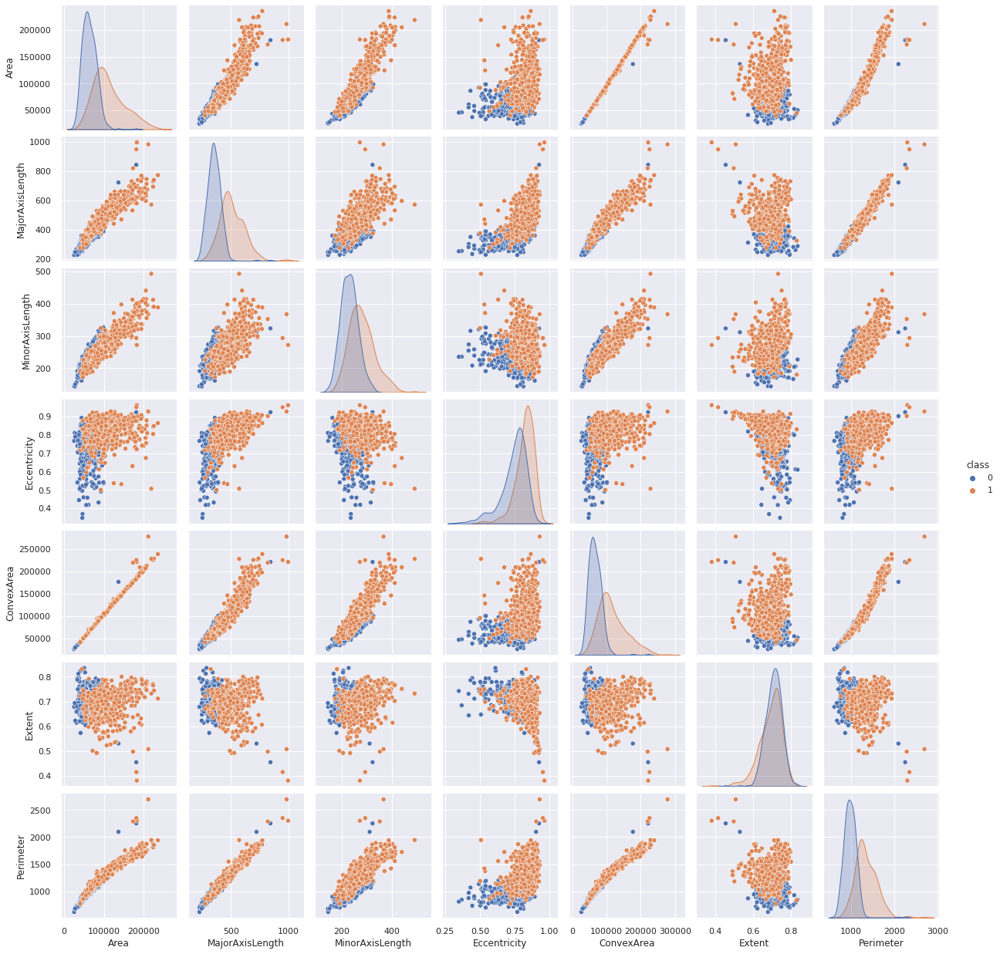

In [ ]:
sns.pairplot(df, hue='class')
plt.show()

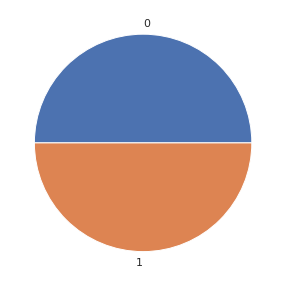

In [ ]:
y =df['class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()
     

In [ ]:
X = df.drop(columns=['class'])
X.head(10)
     

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,1.894781e-16,1.000556,-1.601242,-0.730010,-0.228374,0.441866,3.777353
MajorAxisLength,900.0,0.000000e+00,1.000556,-1.770279,-0.737144,-0.199413,0.545458,4.883667
MinorAxisLength,900.0,-8.210716e-16,1.000556,-2.217269,-0.708091,-0.132898,0.508404,4.759444
Eccentricity,900.0,6.947529e-16,1.000556,-4.794739,-0.440641,0.191694,0.676084,2.000508
ConvexArea,900.0,6.315935e-17,1.000556,-1.596379,-0.728228,-0.234009,0.421867,4.590095
Extent,900.0,1.436875e-15,1.000556,-5.981678,-0.535921,0.147067,0.664006,2.543983
Perimeter,900.0,-6.315935e-17,1.000556,-1.998568,-0.729119,-0.169574,0.520748,5.598604


In [ ]:

observations = list(df.index)
variables = list(df.columns)

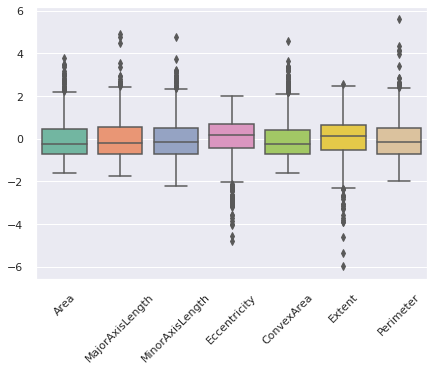

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

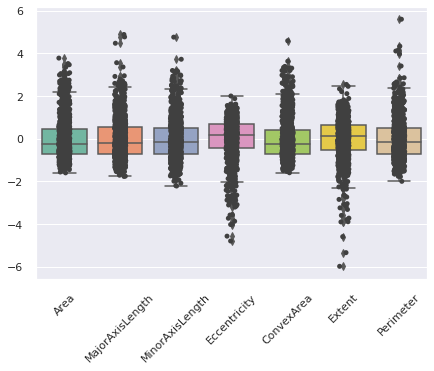

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

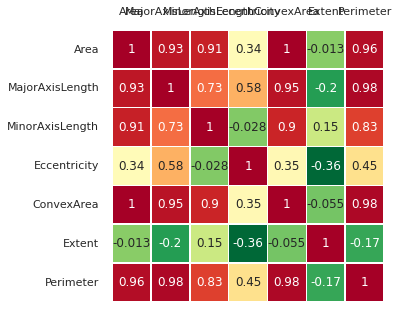

In [ ]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

Text(0, 0.5, '')

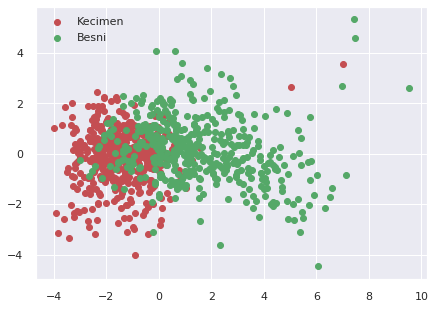

In [ ]:

pca = PCA()
Z = pca.fit_transform(X)
y =df['class']
# 1(Rosa)->0,  2(Kama)->1, 3(Canadian)->2
idx_Kecimen = np.where(y == 0)
idx_Besni = np.where(y == 1)
#idx_Canadian = np.where(y == 2)

plt. figure()
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='r', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='g', label='Besni')
#plt.scatter(Z[idx_Canadian,0], Z[idx_Canadian,1], c='b', label='Canadian')
plt.legend()
plt.xlabel('')
plt.ylabel('')
     

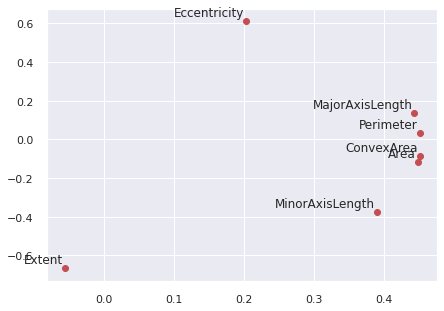

In [ ]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
     

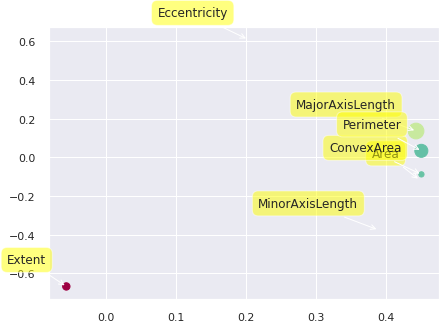

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

Text(0, 0.5, 'Explained variance')

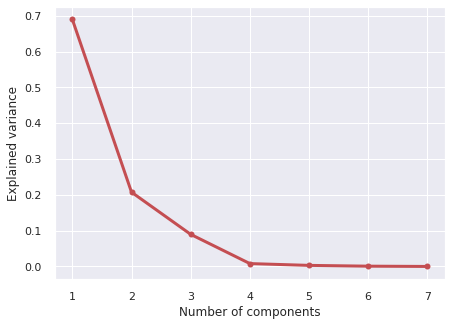

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

Text(0, 0.5, 'Cumulative explained variance')

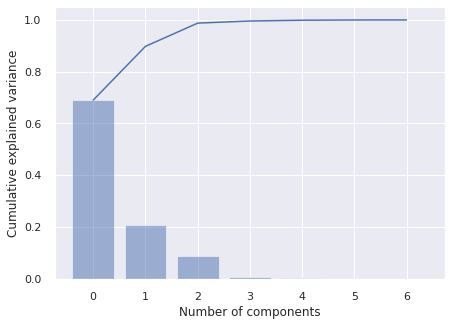

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

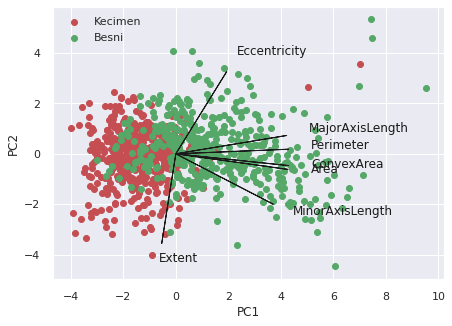

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]


y =df['class']
idx_Kecimen = np.where(y == 0)
idx_Besni = np.where(y == 1)


plt.figure()
plt.xlabel('PC1')
plt.ylabel('PC2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='r', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='g', label='Besni')

plt.legend(loc='upper left')

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)
     

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


In [ ]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7efd96ba0850>)

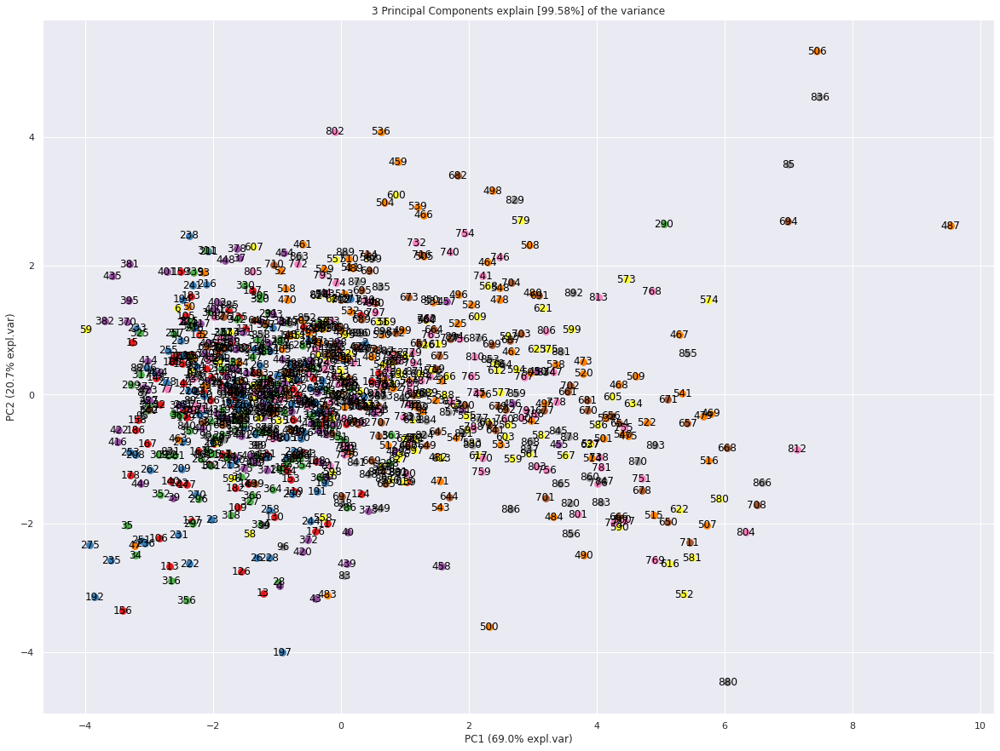

In [ ]:
model.scatter(label=True, legend=False)

In [ ]:
A = out['loadings'].T

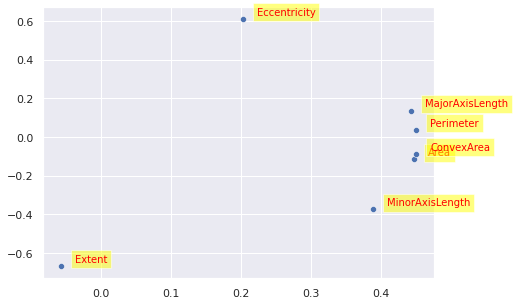

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('')
plt.ylabel('')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

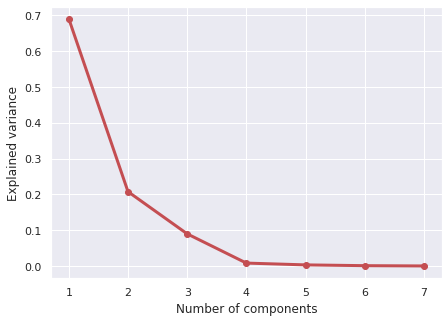

In [ ]:

VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

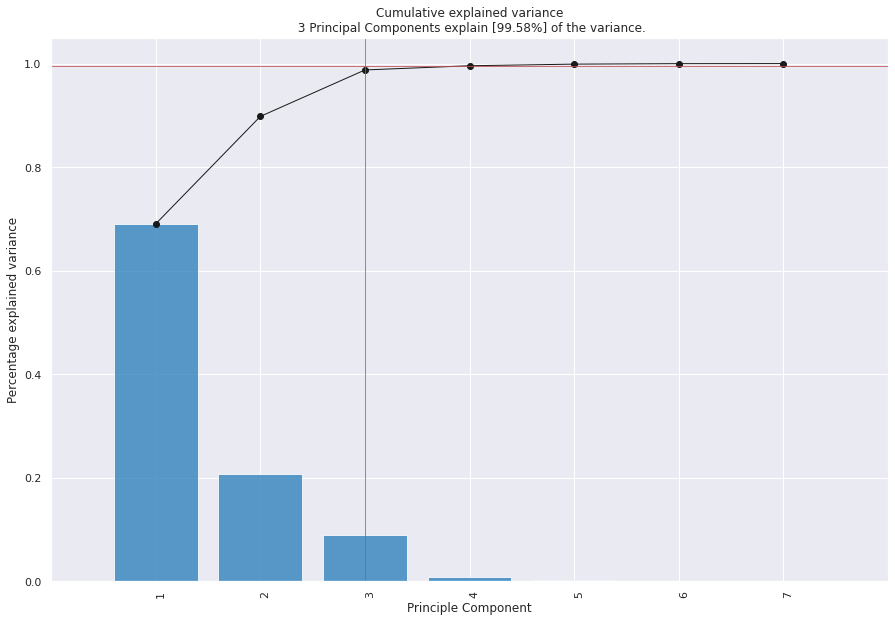

<Figure size 504x360 with 0 Axes>

In [ ]:
model.plot();
     

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


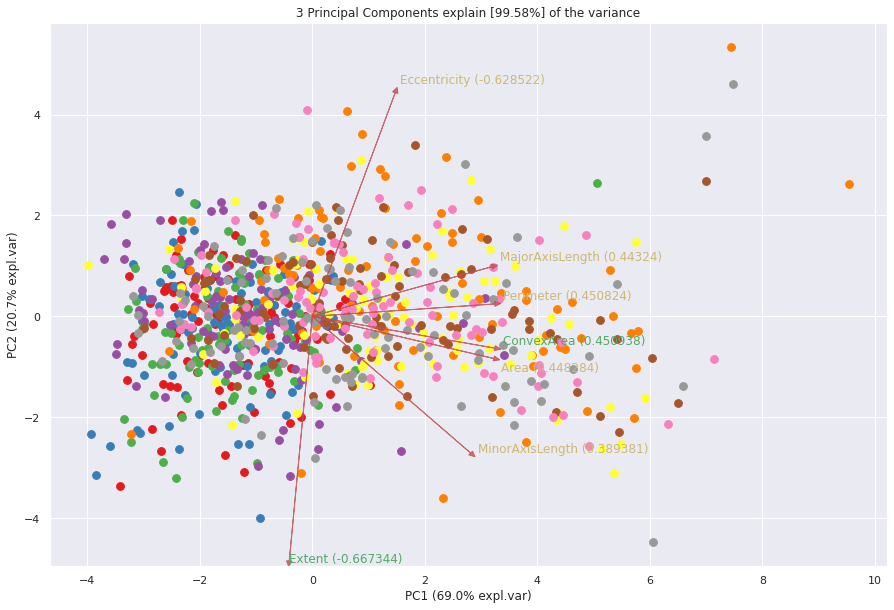

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7efd9d9fa0d0>)

In [ ]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


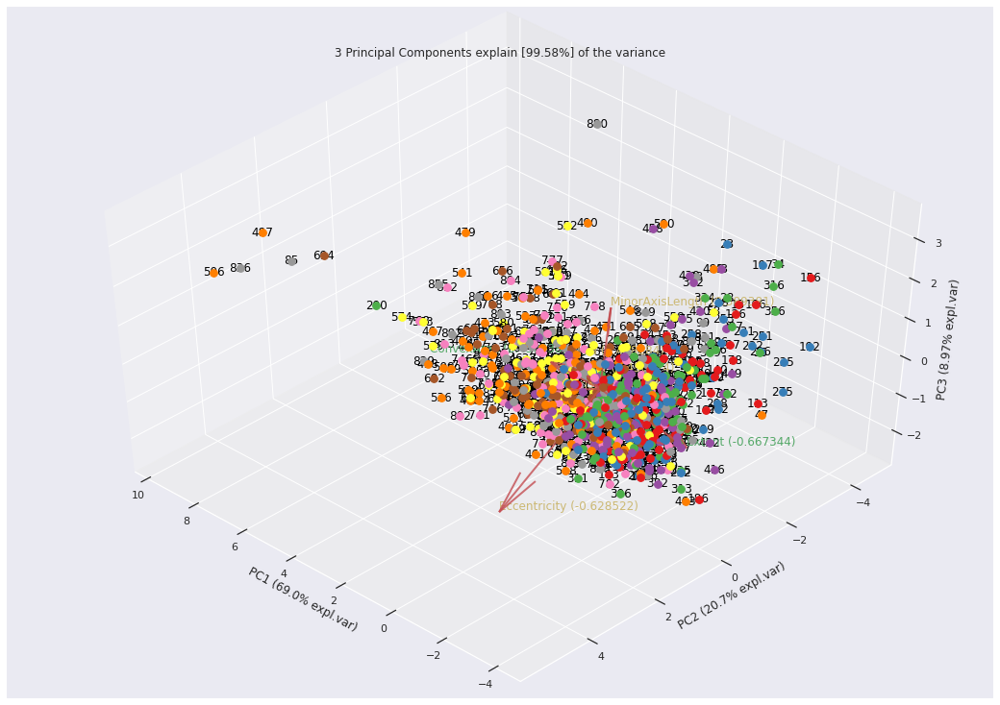

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7efd9dfea820>)

In [ ]:

model.biplot3d(legend=False)

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()
     

Colab mode enabled.


In [ ]:

data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 8)
Unseen Data For Predictions: (90, 8)


In [ ]:

from pycaret.classification import *
clf = setup(data=data, target='class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Binary
3,Label Encoded,"Besni: 0, Kecimen: 1"
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

In [ ]:

 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8852,0.9384,0.9071,0.8701,0.8870,0.7704,0.7736,0.379
et,Extra Trees Classifier,0.8728,0.9296,0.9071,0.8490,0.8761,0.7457,0.7498,0.355
rf,Random Forest Classifier,0.8693,0.9251,0.9143,0.8393,0.8742,0.7387,0.7439,0.427
gbc,Gradient Boosting Classifier,0.8623,0.9229,0.9000,0.8387,0.8662,0.7247,0.7310,0.262
lda,Linear Discriminant Analysis,0.8623,0.9286,0.8643,0.8610,0.8611,0.7245,0.7274,0.025
ridge,Ridge Classifier,0.8605,0.0000,0.8750,0.8516,0.8611,0.7210,0.7251,0.017
qda,Quadratic Discriminant Analysis,0.8603,0.9239,0.9179,0.8239,0.8675,0.7209,0.7273,0.027
lightgbm,Light Gradient Boosting Machine,0.8568,0.9227,0.8858,0.8364,0.8598,0.7136,0.7160,0.219
ada,Ada Boost Classifier,0.8534,0.9106,0.8786,0.8351,0.8555,0.7069,0.7097,0.191
nb,Naive Bayes,0.8377,0.9096,0.9143,0.7916,0.8480,0.6757,0.6854,0.018


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:

dt = create_model('dt')
     

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.7888,0.7500,0.8077,0.7778,0.5783,0.5797
1,0.8070,0.8073,0.8214,0.7931,0.8070,0.6142,0.6145
2,0.8246,0.8245,0.8214,0.8214,0.8214,0.6490,0.6490
3,0.8070,0.8067,0.7857,0.8148,0.8000,0.6137,0.6141
4,0.7895,0.7894,0.7857,0.7857,0.7857,0.5788,0.5788
5,0.7895,0.7894,0.7931,0.7931,0.7931,0.5788,0.5788
6,0.8036,0.8036,0.7500,0.8400,0.7925,0.6071,0.6107
7,0.8036,0.8036,0.8571,0.7742,0.8136,0.6071,0.6107
8,0.8571,0.8571,0.7857,0.9167,0.8462,0.7143,0.7217
9,0.8036,0.8036,0.7857,0.8148,0.8000,0.6071,0.6075


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [ ]:

#trained model object is stored in the variable 'dt'. 
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

In [ ]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.8264,0.9286,0.7647,0.8387,0.6503,0.6651
1,0.8947,0.8953,0.9286,0.8667,0.8966,0.7897,0.7916
2,0.8246,0.8251,0.8571,0.8000,0.8276,0.6494,0.6510
3,0.8246,0.8264,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8596,0.8602,0.8929,0.8333,0.8621,0.7196,0.7213
5,0.9123,0.9107,1.0000,0.8529,0.9206,0.8240,0.8370
6,0.8750,0.8750,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.8393,0.8929,0.8065,0.8475,0.6786,0.6825
8,0.9464,0.9464,1.0000,0.9032,0.9492,0.8929,0.8980
9,0.8393,0.8393,0.8214,0.8519,0.8364,0.6786,0.6790


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=1, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.01, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


In [ ]:

#tuned model object is stored in the variable 'tuned_dt'. 
tuned_dt
     

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=1, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.01, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

In [ ]:
!pip install statsmodels --upgrade


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
evaluate_model(tuned_dt)
     

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=1, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.01, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:

knn = create_model('knn')
     

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8362,0.8214,0.7667,0.7931,0.5793,0.5808
1,0.8070,0.8411,0.8571,0.7742,0.8136,0.6146,0.6181
2,0.8421,0.9033,0.8571,0.8276,0.8421,0.6843,0.6847
3,0.7368,0.8282,0.7857,0.7097,0.7458,0.4745,0.4771
4,0.7193,0.7599,0.7500,0.7000,0.7241,0.4391,0.4402
5,0.9123,0.9452,1.0000,0.8529,0.9206,0.8240,0.8370
6,0.7321,0.8125,0.7500,0.7241,0.7368,0.4643,0.4646
7,0.8750,0.9018,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.8393,0.9043,0.7500,0.9130,0.8235,0.6786,0.6897
9,0.8929,0.9216,0.9286,0.8667,0.8966,0.7857,0.7877


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,30,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7544,0.8073,0.8214,0.7188,0.7667,0.5098,0.5149
1,0.8070,0.8873,0.8214,0.7931,0.8070,0.6142,0.6145
2,0.7193,0.8762,0.7143,0.7143,0.7143,0.4384,0.4384
3,0.7544,0.8645,0.8214,0.7188,0.7667,0.5098,0.5149
4,0.7368,0.8190,0.7857,0.7097,0.7458,0.4745,0.4771
5,0.8947,0.9661,1.0000,0.8286,0.9062,0.7886,0.8069
6,0.8036,0.9037,0.7143,0.8696,0.7843,0.6071,0.6171
7,0.8929,0.9254,0.9286,0.8667,0.8966,0.7857,0.7877
8,0.8571,0.9534,0.8929,0.8333,0.8621,0.7143,0.7161
9,0.8929,0.8954,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=28, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=28, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8682,0.8214,0.8519,0.8364,0.6839,0.6843
1,0.8947,0.9421,0.9286,0.8667,0.8966,0.7897,0.7916
2,0.8947,0.9631,0.8571,0.9231,0.8889,0.7891,0.7911
3,0.8246,0.9212,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8947,0.9323,0.9286,0.8667,0.8966,0.7897,0.7916
5,0.9474,0.9717,1.0000,0.9062,0.9508,0.8945,0.8995
6,0.8393,0.9298,0.8571,0.8276,0.8421,0.6786,0.6790
7,0.8750,0.9439,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9464,0.9783,0.9286,0.9630,0.9455,0.8929,0.8934
9,0.8929,0.9337,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:

tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8682,0.8214,0.8519,0.8364,0.6839,0.6843
1,0.9123,0.9421,0.9643,0.8710,0.9153,0.8248,0.8294
2,0.8947,0.9618,0.8571,0.9231,0.8889,0.7891,0.7911
3,0.8246,0.9212,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8947,0.9323,0.9286,0.8667,0.8966,0.7897,0.7916
5,0.9474,0.9717,1.0000,0.9062,0.9508,0.8945,0.8995
6,0.8393,0.9298,0.8571,0.8276,0.8421,0.6786,0.6790
7,0.8750,0.9439,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9464,0.9783,0.9286,0.9630,0.9455,0.8929,0.8934
9,0.8929,0.9349,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
evaluate_model(tuned_lr)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.8885,0.8214,0.7931,0.8070,0.6142,0.6145
1,0.8947,0.9132,0.9286,0.8667,0.8966,0.7897,0.7916
2,0.9123,0.9711,0.8929,0.9259,0.9091,0.8244,0.8249
3,0.8246,0.8775,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8596,0.9175,0.9286,0.8125,0.8667,0.7199,0.7271
5,0.8947,0.9489,1.0000,0.8286,0.9062,0.7886,0.8069
6,0.8929,0.9490,0.9286,0.8667,0.8966,0.7857,0.7877
7,0.8750,0.9145,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9107,0.9815,0.9286,0.8966,0.9123,0.8214,0.8220
9,0.8214,0.8897,0.8571,0.8000,0.8276,0.6429,0.6445


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.8639,0.8214,0.7931,0.8070,0.6142,0.6145
1,0.8772,0.9212,0.9286,0.8387,0.8814,0.7548,0.7590
2,0.9123,0.9594,0.8929,0.9259,0.9091,0.8244,0.8249
3,0.8246,0.9224,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8947,0.9113,0.9643,0.8438,0.9000,0.7899,0.7978
5,0.9123,0.9643,1.0000,0.8529,0.9206,0.8240,0.8370
6,0.8750,0.9362,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8750,0.9235,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9286,0.9796,0.9286,0.9286,0.9286,0.8571,0.8571
9,0.8393,0.8827,0.8929,0.8065,0.8475,0.6786,0.6825


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
evaluate_model(tuned_rf)
     

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=190, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8682,0.8214,0.8519,0.8364,0.6839,0.6843
1,0.9123,0.9421,0.9643,0.8710,0.9153,0.8248,0.8294
2,0.8947,0.9618,0.8571,0.9231,0.8889,0.7891,0.7911
3,0.8246,0.9212,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8947,0.9323,0.9286,0.8667,0.8966,0.7897,0.7916
5,0.9474,0.9717,1.0000,0.9062,0.9508,0.8945,0.8995
6,0.8393,0.9298,0.8571,0.8276,0.8421,0.6786,0.6790
7,0.8750,0.9439,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9464,0.9783,0.9286,0.9630,0.9455,0.8929,0.8934
9,0.8929,0.9349,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_best_model)
     

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Binary
3,Label Encoded,"Besni: 0, Kecimen: 1"
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='class')),
                ('fix_perfect', Remove_100(target='class')),
                ('clean_names', Clean_Colum_Names()),
       

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.8604,0.9060,0.9107,0.8263,0.8661,0.7211,0.7255,0.023
lr,Logistic Regression,0.8570,0.9206,0.8714,0.8472,0.8572,0.7139,0.7179,0.021
ridge,Ridge Classifier,0.8569,0.0000,0.9179,0.8175,0.8641,0.7142,0.7212,0.013
lda,Linear Discriminant Analysis,0.8569,0.9213,0.9179,0.8175,0.8641,0.7142,0.7212,0.016
lightgbm,Light Gradient Boosting Machine,0.8553,0.9054,0.8828,0.8372,0.8583,0.7107,0.7137,0.047
nb,Naive Bayes,0.8552,0.9199,0.9179,0.8142,0.8626,0.7107,0.7171,0.015
ada,Ada Boost Classifier,0.8517,0.9077,0.8895,0.8273,0.8561,0.7036,0.7076,0.102
qda,Quadratic Discriminant Analysis,0.8463,0.9112,0.9071,0.8092,0.8540,0.6930,0.7011,0.014
rf,Random Forest Classifier,0.8429,0.9069,0.8752,0.8218,0.8466,0.6859,0.6893,0.227
gbc,Gradient Boosting Classifier,0.8412,0.9094,0.8680,0.8235,0.8439,0.6824,0.6858,0.101


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:compare_models() succesfully completed......................................


In [ ]:

best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:

# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9002,0.9286,0.7879,0.8525,0.6851,0.6958
1,0.8772,0.8904,0.8929,0.8621,0.8772,0.7545,0.7549
2,0.8772,0.9655,0.8929,0.8621,0.8772,0.7545,0.7549
3,0.8070,0.9317,0.9286,0.7429,0.8254,0.6156,0.6349
4,0.8596,0.8849,0.8929,0.8333,0.8621,0.7196,0.7213
5,0.9298,0.9446,1.0000,0.8788,0.9355,0.8593,0.8679
6,0.8393,0.9082,0.8929,0.8065,0.8475,0.6786,0.6825
7,0.8929,0.9267,0.9286,0.8667,0.8966,0.7857,0.7877
8,0.9286,0.9528,0.9643,0.9000,0.9310,0.8571,0.8593
9,0.8571,0.9184,0.8929,0.8333,0.8621,0.7143,0.7161


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
print("Numpy version: ", np.__version__)

Numpy version:  1.21.6


In [ ]:
!pip install numba==0.53

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.4 MB 14.1 MB/s 
     |████████████████████████████████| 25.3 MB 1.3 MB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.39.1
    Uninstalling llvmlite-0.39.1:
      Successfully uninstalled llvmlite-0.39.1
  Attempting uninstall: numba
    Found existing installation: numba 0.56.4
    Uninstalling numba-0.56.4:
      Successfully uninstalled numba-0.56.4


In [ ]:
import shap

In [ ]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8898,0.8571,0.7500,0.8000,0.5799,0.5856
1,0.8596,0.8849,0.8929,0.8333,0.8621,0.7196,0.7213
2,0.8246,0.9261,0.7857,0.8462,0.8148,0.6486,0.6502
3,0.8246,0.9113,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8070,0.8725,0.8214,0.7931,0.8070,0.6142,0.6145
5,0.8772,0.8984,0.9310,0.8438,0.8852,0.7539,0.7581
6,0.8393,0.9165,0.8929,0.8065,0.8475,0.6786,0.6825
7,0.8393,0.9094,0.8571,0.8276,0.8421,0.6786,0.6790
8,0.9464,0.9662,0.9643,0.9310,0.9474,0.8929,0.8934
9,0.8214,0.8941,0.8214,0.8214,0.8214,0.6429,0.6429


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:

tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.8892,0.8571,0.7742,0.8136,0.6146,0.6181
1,0.8596,0.8879,0.8929,0.8333,0.8621,0.7196,0.7213
2,0.8421,0.9243,0.8571,0.8276,0.8421,0.6843,0.6847
3,0.8246,0.9064,0.9286,0.7647,0.8387,0.6503,0.6651
4,0.8421,0.8732,0.8571,0.8276,0.8421,0.6843,0.6847
5,0.9123,0.9335,1.0000,0.8529,0.9206,0.8240,0.8370
6,0.8571,0.8929,0.8929,0.8333,0.8621,0.7143,0.7161
7,0.8750,0.9094,0.9286,0.8387,0.8814,0.7500,0.7543
8,0.9286,0.9630,0.9643,0.9000,0.9310,0.8571,0.8593
9,0.8571,0.9267,0.8214,0.8846,0.8519,0.7143,0.7161


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


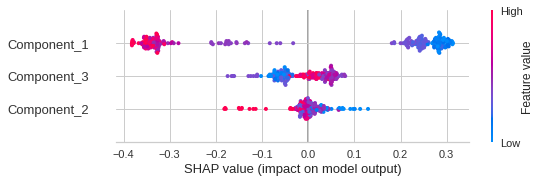

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='summary')

In [ ]:

#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

In [ ]:

interpret_model(tuned_rf_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Binary
3,Label Encoded,"Besni: 0, Kecimen: 1"
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='class')),
                ('fix_perfect', Remove_100(target='class')),
                ('clean_names', Clean_Colum_Names()),
       

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.8711,0.0000,0.9250,0.8340,0.8765,0.7423,0.7481,0.011
lda,Linear Discriminant Analysis,0.8711,0.9213,0.9250,0.8340,0.8765,0.7423,0.7481,0.013
lr,Logistic Regression,0.8658,0.9209,0.8750,0.8584,0.8654,0.7316,0.7339,0.014
svm,SVM - Linear Kernel,0.8658,0.0000,0.8964,0.8468,0.8684,0.7318,0.7376,0.014
knn,K Neighbors Classifier,0.8622,0.9080,0.8967,0.8396,0.8653,0.7244,0.7293,0.023
nb,Naive Bayes,0.8587,0.9162,0.9214,0.8179,0.8661,0.7177,0.7245,0.012
qda,Quadratic Discriminant Analysis,0.8587,0.9152,0.9214,0.8179,0.8661,0.7177,0.7245,0.012
gbc,Gradient Boosting Classifier,0.8552,0.9100,0.8857,0.8354,0.8583,0.7106,0.7149,0.090
ada,Ada Boost Classifier,0.8535,0.9069,0.9001,0.8234,0.8586,0.7073,0.7134,0.093
lightgbm,Light Gradient Boosting Machine,0.8393,0.9030,0.8541,0.8330,0.8411,0.6787,0.6825,0.045


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model_pca

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.0,0.9286,0.7879,0.8525,0.6851,0.6958
1,0.8772,0.0,0.9286,0.8387,0.8814,0.7548,0.7590
2,0.8596,0.0,0.8571,0.8571,0.8571,0.7192,0.7192
3,0.8421,0.0,0.9286,0.7879,0.8525,0.6851,0.6958
4,0.8772,0.0,0.9286,0.8387,0.8814,0.7548,0.7590
5,0.9123,0.0,1.0000,0.8529,0.9206,0.8240,0.8370
6,0.8571,0.0,0.8929,0.8333,0.8621,0.7143,0.7161
7,0.8571,0.0,0.9286,0.8125,0.8667,0.7143,0.7217
8,0.9464,0.0,1.0000,0.9032,0.9492,0.8929,0.8980
9,0.8393,0.0,0.8571,0.8276,0.8421,0.6786,0.6790


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:RidgeClassifier(alpha=8.6, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

RidgeClassifier(alpha=8.6, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RidgeClassifier(alpha=8.6, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…